#Get data

In [ ]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

In [ ]:
!kaggle competitions download -c hbku2019

100% 5.12G/5.13G [04:57<00:00, 19.7MB/s]
100% 5.13G/5.13G [04:57<00:00, 18.5MB/s]


In [ ]:
!unzip hbku2019.zip 

Archive:  hbku2019.zip
  inflating: Cocos_Baseline.ipynb    
  inflating: Cocos_Baseline_v1.ipynb  
  inflating: imgs.zip                
  inflating: labels.zip              


In [ ]:
!unzip imgs.zip
!unzip labels.zip

Streaming output truncated to the last 5000 lines.
  inflating: imgs/train/000000039650.jpg  
  inflating: imgs/train/000000039673.jpg  
  inflating: imgs/train/000000034394.jpg  
  inflating: imgs/train/000000016580.jpg  
  inflating: imgs/train/000000038782.jpg  
  inflating: imgs/train/000000055664.jpg  
  inflating: imgs/train/000000073556.jpg  
  inflating: imgs/train/000000046338.jpg  
  inflating: imgs/train/000000018175.jpg  
  inflating: imgs/train/000000006540.jpg  
  inflating: imgs/train/000000037624.jpg  
  inflating: imgs/train/000000083168.jpg  
  inflating: imgs/train/000000072557.jpg  
  inflating: imgs/train/000000037659.jpg  
  inflating: imgs/train/000000034792.jpg  
  inflating: imgs/train/000000022068.jpg  
  inflating: imgs/train/000000012715.jpg  
  inflating: imgs/train/000000090594.jpg  
  inflating: imgs/train/000000115879.jpg  
  inflating: imgs/train/000000015620.jpg  
  inflating: imgs/train/000000109334.jpg  
  inflating: imgs/train/000000108834.jpg  
  i

#Dataset and Dataloader

In [ ]:
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter
from torchvision import datasets, transforms, models

In [ ]:
try:
  from torchmetrics.classification import MultilabelAccuracy, MultilabelF1Score
except:
  !pip install -q torchmetrics
  from torchmetrics.classification import MultilabelAccuracy, MultilabelF1Score

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 512.4/512.4 KB 24.3 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np

classes = pd.read_csv('labels/categories.csv', header=None)
classes = list(classes[0])
classes, len(classes)

(['person',
  'bicycle',
  'car',
  'motorcycle',
  'airplane',
  'bus',
  'train',
  'truck',
  'boat',
  'traffic light',
  'fire hydrant',
  'stop sign',
  'parking meter',
  'bench',
  'bird',
  'cat',
  'dog',
  'horse',
  'sheep',
  'cow',
  'elephant',
  'bear',
  'zebra',
  'giraffe',
  'backpack',
  'umbrella',
  'handbag',
  'tie',
  'suitcase',
  'frisbee',
  'skis',
  'snowboard',
  'sports ball',
  'kite',
  'baseball bat',
  'baseball glove',
  'skateboard',
  'surfboard',
  'tennis racket',
  'bottle',
  'wine glass',
  'cup',
  'fork',
  'knife',
  'spoon',
  'bowl',
  'banana',
  'apple',
  'sandwich',
  'orange',
  'broccoli',
  'carrot',
  'hot dog',
  'pizza',
  'donut',
  'cake',
  'chair',
  'couch',
  'potted plant',
  'bed',
  'dining table',
  'toilet',
  'tv',
  'laptop',
  'mouse',
  'remote',
  'keyboard',
  'cell phone',
  'microwave',
  'oven',
  'toaster',
  'sink',
  'refrigerator',
  'book',
  'clock',
  'vase',
  'scissors',
  'teddy bear',
  'hair dri

In [ ]:
data = pd.read_csv('labels/labels_train.csv', header=None).sample(frac=1)
data = data.iloc[:20000, :]
data

,0,1,2,3,4,5,6,7,8,9,...,71,72,73,74,75,76,77,78,79,80
75659,000000094691.jpg,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
62572,000000078387.jpg,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
81374,000000101798.jpg,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17285,000000021692.jpg,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
64478,000000080788.jpg,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84910,000000106214.jpg,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
19487,000000024419.jpg,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
55548,000000069625.jpg,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21138,000000026463.jpg,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
from PIL import Image

class MultilabelDataset(Dataset):
  def __init__(self, data, transform, train, trainpct):
    self.transform = transform
    self.data = data
    self.split = int(len(self.data) * trainpct)
    
    if train:
      self.imgpaths = np.asarray(self.data.iloc[:self.split, 0])
      self.labelsarr = np.asarray(self.data.iloc[:self.split, 1:]).astype(np.float32)
    else:
      self.imgpaths = np.asarray(self.data.iloc[self.split:, 0])
      self.labelsarr = np.asarray(self.data.iloc[self.split:, 1:]).astype(np.float32)

  def __getitem__(self, index):
      
    img = Image.open("imgs/train/" + self.imgpaths[index]).convert('RGB')
    if self.transform is not None:
      img = self.transform(img)

    labels = self.labelsarr[index]

    return (img, labels)

  def __len__(self):
    return len(self.imgpaths)

In [ ]:
gpu = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

traindata = MultilabelDataset(data, transform, True, 0.80)
valdata = MultilabelDataset(data, transform, False, 0.80)

batchsize = 32
trainloader = DataLoader(traindata, batch_size=batchsize, shuffle=True)
valloader = DataLoader(valdata, batch_size=batchsize)

print(len(traindata), len(valdata), len(trainloader), len(valloader))

16000 4000 500 125


#Model creation

In [ ]:
!pip install tensorboard

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
def create_resnext():
  weights = models.ResNeXt50_32X4D_Weights.DEFAULT
  model = models.resnext50_32x4d(weights=weights).to(gpu)
  
  torch.manual_seed(42)
  torch.cuda.manual_seed(42)

  for param in model.parameters():
    param.requires_grad = False

  model.fc = nn.Sequential(
      nn.Linear(in_features=2048, out_features=len(classes), bias=True)
  ).to(gpu)

  return model

def create_vit():
  weights = models.ViT_B_16_Weights.DEFAULT
  model = models.vit_b_16(weights=weights).to(gpu)

  torch.manual_seed(42)
  torch.cuda.manual_seed(42)

  for param in model.parameters():
    param.requires_grad = False

  model.heads.head = nn.Linear(in_features=768, out_features=len(classes), bias=True).to(gpu)

  return model
  
def create_maxvit():
  weights = models.MaxVit_T_Weights.DEFAULT
  model = models.maxvit_t(weights=weights).to(gpu)

  torch.manual_seed(42)
  torch.cuda.manual_seed(42)

  for param in model.parameters():
    param.requires_grad = False

  model.classifier[5] = nn.Linear(in_features=512, out_features=len(classes), bias=True).to(gpu)

  return model

def create_swin():
  weights = models.Swin_T_Weights.DEFAULT
  model = models.swin_t(weights=weights).to(gpu)

  torch.manual_seed(42)
  torch.cuda.manual_seed(42)

  for param in model.parameters():
    param.requires_grad = False

  model.head = nn.Linear(in_features=768, out_features=len(classes), bias=True).to(gpu)
  
  return model

#Training and Testing

In [ ]:
#Training and testing loop will call sigmoid as func is not there in the networks

from tqdm.auto import tqdm

accfn = MultilabelAccuracy(num_labels=len(classes))
f1fn = MultilabelF1Score(num_labels=len(classes))

def trainloop(model, trainloader, lossfn, optim):
  totalloss, totalacc, totalf1 = 0, 0, 0
  n = len(trainloader)

  model.train()
  for x, y in tqdm(trainloader):
    ylogit = model(x.to(gpu))
    yprob = torch.sigmoid(ylogit)
    ypred = np.around(yprob.detach().cpu())
    
    loss = lossfn(yprob, y.to(gpu))
    optim.zero_grad()
    loss.backward()
    optim.step()

    totalloss += loss.item()
    totalacc += accfn(ypred, y).item()
    totalf1 += f1fn(ypred, y).item()

  return totalloss/n, totalacc/n, totalf1/n

def testloop(model, testloader, lossfn):
  totalloss, totalacc, totalf1 = 0, 0, 0
  n = len(testloader)

  model.eval()
  with torch.inference_mode():
    for x, y in tqdm(testloader):
      ylogit = model(x.to(gpu))
      yprob = torch.sigmoid(ylogit)
      ypred = np.around(yprob.detach().cpu())

      loss = lossfn(yprob, y.to(gpu))

      totalloss += loss.item()
      totalacc += accfn(ypred, y).item()
      totalf1 += f1fn(ypred, y).item()

  return totalloss/n, totalacc/n, totalf1/n

In [ ]:
modelnames = ['resnext', 'vit', 'maxvit', 'swin']

In [ ]:
import os

expno = 1
epochs = 3

torch.manual_seed(42)
torch.cuda.manual_seed(42)

for modelname in modelnames:
  print("Experiment", expno)
  print("Model", modelname)

  if modelname == 'resnext':
    model = create_resnext()
  elif modelname == 'vit':
    model = create_vit()
  elif modelname == 'maxvit':
    model = create_maxvit()
  else:
    model = create_swin()

  lossfn = nn.BCELoss()
  optim = torch.optim.Adam(params=model.parameters(), lr=0.01)

  logdir = os.path.join("runs", modelname)
  writer = SummaryWriter(log_dir=logdir)

  for epoch in tqdm(range(epochs)):
    trainloss, trainacc, trainf1 = trainloop(model, trainloader, lossfn, optim)
    valloss, valacc, valf1 = testloop(model, valloader, lossfn)
    print("Epoch:", epoch+1, "Train loss:", trainloss, "Train acc:", trainacc, "Train f1:", trainf1,\
          "Val loss:", valloss, "Val acc:", valacc, "Val f1:", valf1)

    writer.add_scalars(main_tag='Loss', tag_scalar_dict={'train loss':trainloss, 'validation loss':valloss}, global_step=epoch+1)
    writer.add_scalars(main_tag='Accuracy', tag_scalar_dict={'train accuracy':trainacc, 'validation accuracy':valacc}, global_step=epoch+1)
    writer.add_scalars(main_tag='F1 score', tag_scalar_dict={'train f1':trainf1, 'validation f1':valf1}, global_step=epoch+1)

  writer.close()

  modelpath = str(expno) + " " + modelname + '.pth'
  torch.save(model.state_dict(), modelpath)
  print("Model saved to", modelpath)

  print('-'*50 + '\n')

  expno += 1

Experiment 1
Model resnext


Downloading: "https://download.pytorch.org/models/resnext50_32x4d-1a0047aa.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-1a0047aa.pth


  0%|          | 0.00/95.8M [00:00<?, ?B/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

Epoch: 1 Train loss: 0.10193166316300631 Train acc: 0.9716054635643959 Train f1: 0.25210630742274226 Val loss: 0.09507044288516045 Val acc: 0.9731718649864197 Val f1: 0.27762529504299166


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

Epoch: 2 Train loss: 0.08058434294909239 Train acc: 0.9757617087364197 Train f1: 0.31448347797989845 Val loss: 0.10361838087439537 Val acc: 0.9717937445640564 Val f1: 0.2816783529520035


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

Epoch: 3 Train loss: 0.07425758906453848 Train acc: 0.9773437386751175 Train f1: 0.33724248194694517 Val loss: 0.11174237674474716 Val acc: 0.9717749953269958 Val f1: 0.29269419026374816
Model saved to 1 resnext.pth
--------------------------------------------------

Experiment 2
Model vit


Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth


  0%|          | 0.00/330M [00:00<?, ?B/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

Epoch: 1 Train loss: 0.09896759225428105 Train acc: 0.9695562399625778 Train f1: 0.28058484549075363 Val loss: 0.08901113551855087 Val acc: 0.9728374910354615 Val f1: 0.3101018574237823


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

Epoch: 2 Train loss: 0.07807458691298962 Train acc: 0.9762062402963638 Train f1: 0.3249871796965599 Val loss: 0.09398773318529129 Val acc: 0.9736093678474427 Val f1: 0.30146328353881835


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

Epoch: 3 Train loss: 0.07384356490522623 Train acc: 0.9773070228099823 Train f1: 0.33770684045553206 Val loss: 0.09582526850700378 Val acc: 0.9732718687057496 Val f1: 0.3044984530210495
Model saved to 2 vit.pth
--------------------------------------------------

Experiment 3
Model maxvit


/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Downloading: "https://download.pytorch.org/models/maxvit_t-bc5ab103.pth" to /root/.cache/torch/hub/checkpoints/maxvit_t-bc5ab103.pth


  0%|          | 0.00/119M [00:00<?, ?B/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

Epoch: 1 Train loss: 0.09036219862103462 Train acc: 0.9728242104649544 Train f1: 0.2607030217330903 Val loss: 0.07469372656941414 Val acc: 0.9766562414169312 Val f1: 0.30064226055145266


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

Epoch: 2 Train loss: 0.07211717568337918 Train acc: 0.977153112411499 Train f1: 0.3096188408136368 Val loss: 0.07331944927573204 Val acc: 0.9770249881744385 Val f1: 0.3024007041454315


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

Epoch: 3 Train loss: 0.06964720986783504 Train acc: 0.9774445170164108 Train f1: 0.31501663935184476 Val loss: 0.07396291872859001 Val acc: 0.9766343698501587 Val f1: 0.304968115568161
Model saved to 3 maxvit.pth
--------------------------------------------------

Experiment 4
Model swin


Downloading: "https://download.pytorch.org/models/swin_t-704ceda3.pth" to /root/.cache/torch/hub/checkpoints/swin_t-704ceda3.pth


  0%|          | 0.00/108M [00:00<?, ?B/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

Epoch: 1 Train loss: 0.09028719721734524 Train acc: 0.9728648331165314 Train f1: 0.27257537832297385 Val loss: 0.08137035581469536 Val acc: 0.9759249939918518 Val f1: 0.31725520598888396


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

Epoch: 2 Train loss: 0.08163341606408357 Train acc: 0.9754648344516754 Train f1: 0.30711701771616934 Val loss: 0.08767804706096649 Val acc: 0.9759687452316285 Val f1: 0.3096690338850021


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

Epoch: 3 Train loss: 0.0800081913843751 Train acc: 0.9760460869073868 Train f1: 0.31712783896923064 Val loss: 0.08813216623663903 Val acc: 0.9757218699455261 Val f1: 0.31554904305934905
Model saved to 4 swin.pth
--------------------------------------------------



#Logging

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


<IPython.core.display.Javascript object>

In [ ]:
!tensorboard dev upload --logdir runs \
--name "Experiment Tracking: Multilabel classification" \
--description "Comparing results of different ViT models and learning rates"
--oneshot

In [ ]:
!tensorboard dev auth revoke

#Test set human evaluation

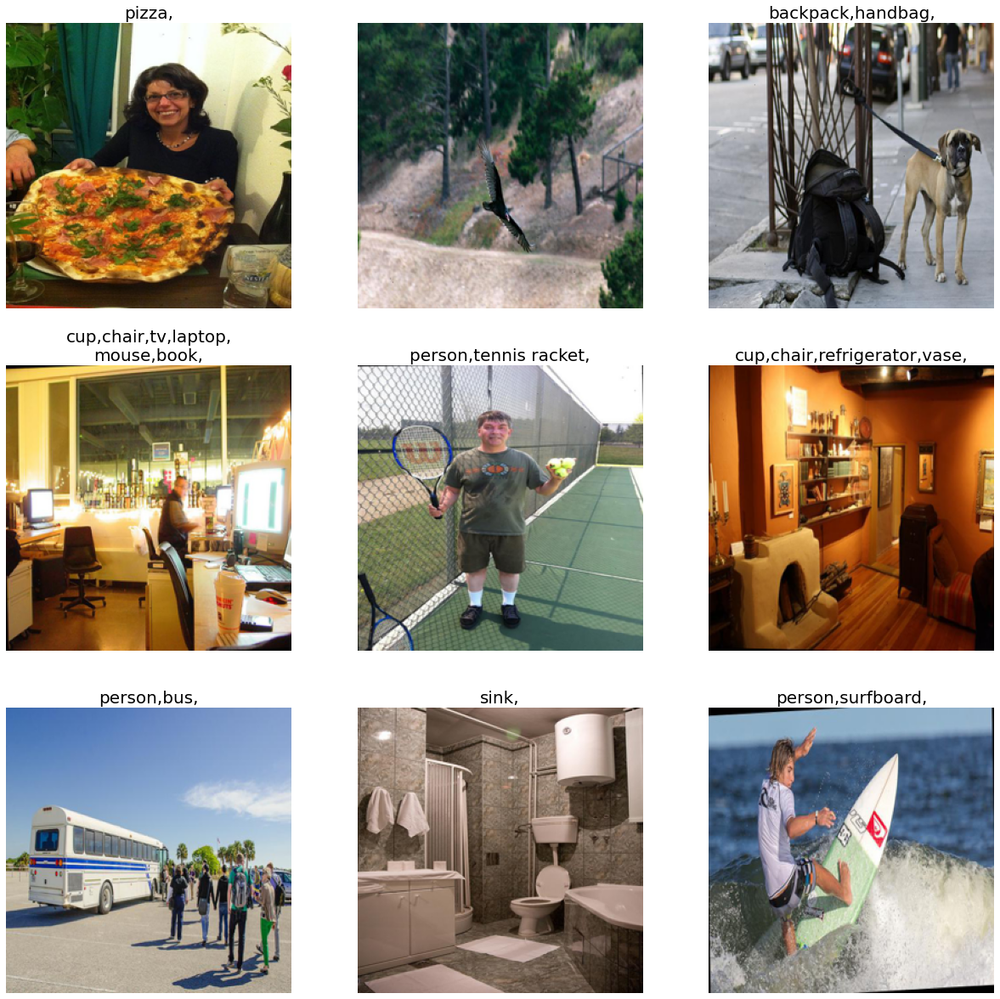

In [ ]:
import random
from matplotlib import pyplot as plt

imgs = random.sample(os.listdir('imgs/test/'), 9)

model = create_maxvit()
model.load_state_dict(torch.load('3 maxvit.pth'))

plt.figure(figsize=(21, 21))

for i in range(9):
  img = Image.open('imgs/test/' + imgs[i]).convert('RGB')
  newimg = transform(img).unsqueeze(dim=0)

  model.eval()
  with torch.inference_mode():
    yprob = model(newimg.to(gpu)).cpu()

  indices = np.where(yprob.squeeze(dim=0) > 0.5)

  plt.subplot(3, 3, i+1)
  plt.imshow(img.resize((256, 256)))
  plt.axis(False)
  
  objects = ''
  space = 0
  for idx in indices[0]:
    objects += classes[idx] + ','
    space += 1
    if space % 4 == 0:
      objects += '\n'
  
  plt.title(objects.rstrip(), fontsize=20)

#Test csv for submission

In [ ]:
class CustomTestDataset(Dataset):
  def __init__(self, path, transform):
    self.transform = transform
    self.path = path
    self.paths = sorted(os.listdir(path))
    self.image_arr = np.asarray(self.paths)
    self.data_len = len(self.image_arr)

  def __getitem__(self, index):
    single_image_name = self.image_arr[index]
    img = Image.open(self.path + single_image_name).convert('RGB')

    if self.transform is not None:
      img = self.transform(img)

    return (img, single_image_name)

  def __len__(self):
    return self.data_len

In [ ]:
testdata = CustomTestDataset('imgs/test/', transform)
testloader = DataLoader(testdata, batch_size=1, shuffle=False)

In [ ]:
predictions = None

model.eval()
with torch.inference_mode():
  for x, _ in tqdm(testloader):
    yprob = model(x.to(gpu)).detach().cpu()
    outputs = np.around(yprob)
    try:
      predictions = np.concatenate((predictions,outputs))
    except:
      predictions = outputs

  0%|          | 0/24444 [00:00<?, ?it/s]

In [ ]:
outputs = []
for x in predictions:
    a = np.nonzero(x)[0]
    b = " ".join(map(str, a))
    outputs.append(b)

In [ ]:
submission = pd.DataFrame({'id':testdata.paths, 'predictions':outputs})
submission.to_csv('transformer_submission.csv', index=False)

In [ ]:
pd.read_csv('transformer_submission.csv')

,id,predictions
0,000000000000.jpg,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18...
1,000000000003.jpg,0 1 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 1...
2,000000000023.jpg,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18...
3,000000000031.jpg,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 16 17 18 19...
4,000000000035.jpg,1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 1...
...,...,...
24439,000000122187.jpg,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18...
24440,000000122192.jpg,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 16 17 18 19...
24441,000000122197.jpg,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18...
24442,000000122202.jpg,0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18...
